<span style="background-color: #FFFF00"><h1> Notebook 3</h1> </span>

**Project: "Intra-Regional Migration and Transportation in New York Metro Area"**







<h2>
<code style="background:grey;color:black">This Notebook's Goal:
</code>
</h2>

<p>
In this notebook, we focus on our step 5 in our designed research process - to compare transit-area vs. non-transit-area data to see if transit plays an important role in forming local communities in the process of intra-regional migration. This is a new section we decided to do after midterm<p>

<p>
In this section, we started to zoom in on the census tract level and involves lots of data comparison on the interactive maps. Therefore, this week, we only applied a part of our data (only one county and one train railroad) to test out the coding stuff. Glad this coding works out, so we wil continue building this coding to apply to all data in the following week. <p>

<h2>
<code style="background:grey;color:black">Research Step 5
</code>
</h2>

<p>
In this section, we started to test out how to compare the census data in transit area vs in non transit area by using the fuction "buffer". We first apply both census tract data and transit data as the basemaps. Then we use each station as the point to draw a half mile radius circle and then make those circles to "overlay" on the census data so that we have those average nubmer touched by the circles. Finally, we figured out how to use folium to show the data and finding via different layers.<p>

In [1]:
# Import all required modules

import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import folium
from geopandas import GeoDataFrame
from shapely.geometry import Point

In [2]:
# This is the base census data

NYS_CensusTract_Rawdata = gpd.read_file('data5/cb_2018_36_tract_500k.shp')

In [3]:
# take some basic data exploration and cleaning.

NYS_CensusTract_Rawdata.head()

,STATEFP,COUNTYFP,TRACTCE,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,36,019,101100,1400000US36019101100,36019101100,1011,CT,583322,57750,"POLYGON ((-73.46914 44.69043, -73.46972 44.693..."
1,36,021,000402,1400000US36021000402,36021000402,4.02,CT,42294908,1437327,"POLYGON ((-73.72088 42.45322, -73.71799 42.470..."
2,36,023,970700,1400000US36023970700,36023970700,9707,CT,2082176,0,"POLYGON ((-76.20049 42.61248, -76.19596 42.612..."
3,36,081,046200,1400000US36081046200,36081046200,462,CT,249611,0,"POLYGON ((-73.79203 40.71107, -73.79101 40.711..."
4,36,081,048100,1400000US36081048100,36081048100,481,CT,139052,0,"POLYGON ((-73.88799 40.74355, -73.88621 40.743..."


In [4]:
Columns_To_Keep1 = ['AFFGEOID','geometry']
NYS_CensusTract_Rawdata_trimmed = NYS_CensusTract_Rawdata[Columns_To_Keep1]

In [5]:
NYS_CensusTract_Rawdata_trimmed.head()

,AFFGEOID,geometry
0,1400000US36019101100,"POLYGON ((-73.46914 44.69043, -73.46972 44.693..."
1,1400000US36021000402,"POLYGON ((-73.72088 42.45322, -73.71799 42.470..."
2,1400000US36023970700,"POLYGON ((-76.20049 42.61248, -76.19596 42.612..."
3,1400000US36081046200,"POLYGON ((-73.79203 40.71107, -73.79101 40.711..."
4,1400000US36081048100,"POLYGON ((-73.88799 40.74355, -73.88621 40.743..."


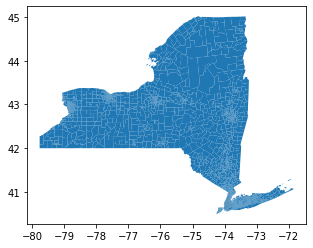

In [6]:
NYS_CensusTract_Rawdata_trimmed.plot()

In [7]:
Tract_County1 = NYS_CensusTract_Rawdata_trimmed[NYS_CensusTract_Rawdata.COUNTYFP == '103']

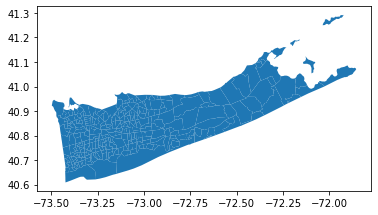

In [8]:
Tract_County1.plot()

In [9]:
# Because we are going to do buffering for each point, we want to make sure all our geo measurments are on the same CRS. 
#So we convert all following geodata to 2272

Tract_County1_crs = Tract_County1.to_crs(epsg=2272)

In [10]:
# making sure the change is successful

print(Tract_County1_crs.crs)

epsg:2272


## Train Station Dataframe

In [11]:
# now we are going to import the transit data as the basemap

LIRR_Railroad_Rawdata = gpd.read_file('data5/LIRR/geo_export_c4344150-8906-4247-ba0d-70c66f79a2cd.shp')

LIRR_Station_Rawdata = gpd.read_file('data5/LIRR/geo_export_cd021d1d-1a5d-46e9-bff6-446db61db8cc.shp')

In [12]:
LIRR_Railroad_Rawdata.head()

,routename,geometry
0,Babylon,"LINESTRING (-73.99309 40.75074, -73.99245 40.7..."
1,Babylon,"LINESTRING (-73.32470 40.70060, -73.32538 40.7..."
2,Babylon,"LINESTRING (-73.32470 40.70060, -73.32538 40.7..."
3,Babylon,"LINESTRING (-73.32470 40.70060, -73.32538 40.7..."
4,Babylon,"LINESTRING (-73.97736 40.68475, -73.97687 40.6..."


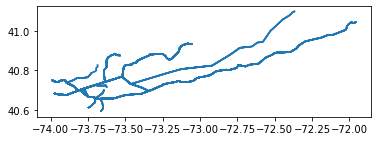

In [13]:
LIRR_Railroad_Rawdata.plot()

In [14]:
LIRR_Station_Rawdata_crs = LIRR_Station_Rawdata.to_crs(epsg=2272)

In [15]:
print(LIRR_Station_Rawdata_crs.crs)

epsg:2272


In [16]:
LIRR_Station_Rawdata_crs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   stopname  124 non-null    object  
 1   geometry  124 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 2.1+ KB


In [17]:
LIRR_Station_Rawdata_crs['lon'] = LIRR_Station_Rawdata['geometry'].x
LIRR_Station_Rawdata_crs['lat'] = LIRR_Station_Rawdata['geometry'].y

In [18]:
LIRR_Station_Rawdata_crs.head()

,stopname,geometry,lon,lat
0,Long Island City,POINT (3019395.107 535479.309),-73.95639,40.74128
1,Hunterspoint Avenue,POINT (3022035.576 535994.076),-73.94679,40.74238
2,Penn Station,POINT (3008955.006 538424.062),-73.99358,40.75058
3,Woodside,POINT (3034111.720 537779.211),-73.90297,40.74584
4,Forest Hills,POINT (3050634.467 528924.918),-73.84481,40.71957


In [19]:
# this is the critical part. we are buffer the data point of each station by half mile.
# then we have a new column that contains all buffer geometry data

buffer_distance = 0.5 * 5280

LIRR_Station_Rawdata_crs['geometry_buffer'] = LIRR_Station_Rawdata_crs.geometry.buffer(buffer_distance)

In [20]:
LIRR_Station_Rawdata_crs.head()

,stopname,geometry,lon,lat,geometry_buffer
0,Long Island City,POINT (3019395.107 535479.309),-73.95639,40.74128,"POLYGON ((3022035.107 535479.309, 3022022.395 ..."
1,Hunterspoint Avenue,POINT (3022035.576 535994.076),-73.94679,40.74238,"POLYGON ((3024675.576 535994.076, 3024662.864 ..."
2,Penn Station,POINT (3008955.006 538424.062),-73.99358,40.75058,"POLYGON ((3011595.006 538424.062, 3011582.293 ..."
3,Woodside,POINT (3034111.720 537779.211),-73.90297,40.74584,"POLYGON ((3036751.720 537779.211, 3036739.008 ..."
4,Forest Hills,POINT (3050634.467 528924.918),-73.84481,40.71957,"POLYGON ((3053274.467 528924.918, 3053261.755 ..."


In [21]:
LIRR_Station_Rawdata_crs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   stopname         124 non-null    object  
 1   geometry         124 non-null    geometry
 2   lon              124 non-null    float64 
 3   lat              124 non-null    float64 
 4   geometry_buffer  124 non-null    geometry
dtypes: float64(2), geometry(2), object(1)
memory usage: 5.0+ KB


In [22]:
LIRR_Station_Rawdata_crs_map = LIRR_Station_Rawdata_crs.drop(['lon','lat','geometry'],axis=1)

In [23]:
LIRR_Station_Rawdata_crs_map.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   stopname         124 non-null    object  
 1   geometry_buffer  124 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 2.1+ KB


In [24]:
LIRR_Station_Rawdata_crs_map.columns = ['stopname','geometry']

In [25]:
LIRR_Station_Rawdata_crs_map.head()

,stopname,geometry
0,Long Island City,"POLYGON ((3022035.107 535479.309, 3022022.395 ..."
1,Hunterspoint Avenue,"POLYGON ((3024675.576 535994.076, 3024662.864 ..."
2,Penn Station,"POLYGON ((3011595.006 538424.062, 3011582.293 ..."
3,Woodside,"POLYGON ((3036751.720 537779.211, 3036739.008 ..."
4,Forest Hills,"POLYGON ((3053274.467 528924.918, 3053261.755 ..."


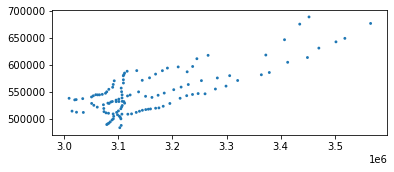

In [26]:
LIRR_Station_Rawdata_crs_map.plot()

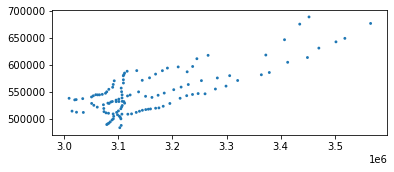

In [27]:
LIRR_Station_Rawdata_crs_map.plot()

# Map

In [28]:
# now we are trying to make some interactive maps with Folium. We are trying to add multiple layers into one map

m = folium.Map(location=[40.730610,-73.935242],
           tiles='OpenStreetMap',
          zoom_start=8.5
          )

In [29]:
m

In [30]:
# create for loop to map all station

for index, row in LIRR_Station_Rawdata_crs.iterrows():
    folium.Marker([row.lat, row.lon], popup=row.stopname).add_to(m)

In [31]:
Tract_County1_crs['stopname']='No'

In [32]:
# using for loop to assign the new values if the census data is intersected with the created buffer geometry

for index_s, row_s in LIRR_Station_Rawdata_crs.iterrows():
    
    for index_t, row_t in Tract_County1_crs.iterrows():
        if row_t.geometry.intersects(row_s.geometry_buffer) == True:
            Tract_County1_crs.at[index_t,'stopname'] = LIRR_Station_Rawdata_crs.at[index_s,'stopname']
    

In [33]:
Tract_County1_crs.head(50)

,AFFGEOID,geometry,stopname
6,1400000US36103158804,"POLYGON ((3271495.105 563714.033, 3271787.234 ...",No
7,1400000US36103159508,"POLYGON ((3324563.715 560527.321, 3324551.669 ...",No
8,1400000US36103190800,"POLYGON ((3427592.295 595673.672, 3439372.827 ...",Southampton
9,1400000US36103990100,"POLYGON ((3502127.951 667800.745, 3502130.644 ...",No
56,1400000US36103147803,"POLYGON ((3256602.714 554005.289, 3257590.937 ...",Sayville
57,1400000US36103158108,"POLYGON ((3251874.981 598354.549, 3253210.684 ...",No
58,1400000US36103158309,"POLYGON ((3282586.185 596927.891, 3283758.160 ...",No
59,1400000US36103158408,"POLYGON ((3299818.880 628358.526, 3300348.502 ...",No
167,1400000US36103111001,"POLYGON ((3164442.979 589916.776, 3165164.993 ...",Huntington
168,1400000US36103111703,"POLYGON ((3191405.964 594334.279, 3194046.005 ...",Northport


In [34]:
Tract_WithinStops = Tract_County1_crs[Tract_County1_crs['stopname'] != 'No']

In [35]:
Tract_WithinStops.head()

,AFFGEOID,geometry,stopname
8,1400000US36103190800,"POLYGON ((3427592.295 595673.672, 3439372.827 ...",Southampton
56,1400000US36103147803,"POLYGON ((3256602.714 554005.289, 3257590.937 ...",Sayville
167,1400000US36103111001,"POLYGON ((3164442.979 589916.776, 3165164.993 ...",Huntington
168,1400000US36103111703,"POLYGON ((3191405.964 594334.279, 3194046.005 ...",Northport
295,1400000US36103145704,"POLYGON ((3224519.302 567830.020, 3225701.112 ...",Central Islip


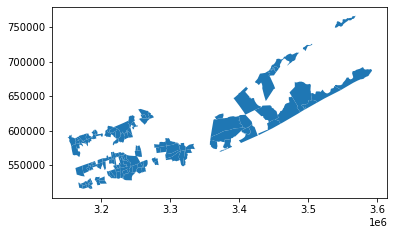

In [36]:
Tract_WithinStops.plot()

# Database

In [37]:
commutingCSV = pd.read_csv('data5/commuting_time.csv')

In [38]:
commutingCSV.columns = ['AFFGEOID','Name','2014','2018','Diff','Change']

In [39]:
alltract = Tract_County1.merge(commutingCSV,
                               on='AFFGEOID',
                               how='right')

In [40]:
alltract.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 323 entries, 0 to 322
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   AFFGEOID  323 non-null    object  
 1   geometry  323 non-null    geometry
 2   Name      323 non-null    object  
 3   2014      323 non-null    int64   
 4   2018      323 non-null    int64   
 5   Diff      323 non-null    int64   
 6   Change    323 non-null    object  
dtypes: geometry(1), int64(3), object(3)
memory usage: 20.2+ KB


In [41]:
df_merge = Tract_WithinStops.merge(commutingCSV,on='AFFGEOID',how='left')

In [42]:
df_merge.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 128 entries, 0 to 127
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   AFFGEOID  128 non-null    object  
 1   geometry  128 non-null    geometry
 2   stopname  128 non-null    object  
 3   Name      128 non-null    object  
 4   2014      128 non-null    int64   
 5   2018      128 non-null    int64   
 6   Diff      128 non-null    int64   
 7   Change    128 non-null    object  
dtypes: geometry(1), int64(3), object(4)
memory usage: 9.0+ KB


In [43]:
df_merge_group = df_merge.groupby('stopname').mean()

In [44]:
df_merge_group.info()

<class 'pandas.core.frame.DataFrame'>
Index: 40 entries, Amagansett to Yaphank
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2014    40 non-null     float64
 1   2018    40 non-null     float64
 2   Diff    40 non-null     float64
dtypes: float64(3)
memory usage: 1.2+ KB


In [45]:
df_merge_group = df_merge_group.reset_index()

In [46]:
df_merge_group.head()

,stopname,2014,2018,Diff
0,Amagansett,9.000000,36.000000,27.000000
1,Babylon,250.500000,95.000000,-155.500000
2,Bay Shore,191.000000,87.333333,-103.666667
3,Bellport,71.500000,289.500000,218.000000
4,Brentwood,69.833333,96.000000,26.166667


In [47]:
df_merge_group_geo = LIRR_Station_Rawdata_crs_map.merge(df_merge_group,
                                            on='stopname',
                                            how='right')

In [48]:
df_merge_group_geo.head()

,stopname,geometry,2014,2018,Diff
0,Cold Spring Harbor,"POLYGON ((3160237.922 576226.224, 3160225.210 ...",372.000000,89.500000,-282.50
1,Huntington,"POLYGON ((3171413.448 583109.353, 3171400.736 ...",128.285714,96.285714,-32.00
2,Greenlawn,"POLYGON ((3184025.225 589445.519, 3184012.512 ...",182.500000,134.750000,-47.75
3,Northport,"POLYGON ((3193300.912 594278.694, 3193288.199 ...",125.750000,81.750000,-44.00
4,Kings Park,"POLYGON ((3213193.085 596385.335, 3213180.372 ...",173.500000,144.250000,-29.25


In [49]:
folium.Choropleth(geo_data=alltract,
                 name='All Census Tract',
                 data=alltract,
                 columns=['Name','Diff'],
                 key_on="feature.properties.Name",
                 fill_color='YlGnBu',
                 fill_opacity=0.8,
                 line_opacity=0.2,
                 smooth_factor=0
                ).add_to(m)

In [50]:
folium.Choropleth(geo_data=df_merge_group_geo,
                 name='Station Area',
                 data=df_merge_group,
                 columns=['stopname','Diff'],
                 key_on="feature.properties.stopname",
                 fill_color='YlGnBu',
                 fill_opacity=0.8,
                 line_opacity=1,
                 smooth_factor=0
                ).add_to(m) 

In [51]:
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
notes2 = folium.features.GeoJson(alltract,
                                style_function=style_function, 
                                control=False,
                                highlight_function=highlight_function, 
                                tooltip=folium.features.GeoJsonTooltip(
                                    fields=['Name','Diff'],
                                    aliases=['Cencus Tract: ','Average Commuter Decrease: '],
                                    style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
                                )
                            )
m.add_child(notes2)
m.keep_in_front(notes2)


In [52]:
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 2}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}
notes = folium.features.GeoJson(df_merge_group_geo,
                                style_function=style_function, 
                                control=False,
                                highlight_function=highlight_function, 
                                tooltip=folium.features.GeoJsonTooltip(
                                    fields=['stopname','Diff'],
                                    aliases=['Station Area: ','Average Commuter Decrease: '],
                                    style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
                                )
                            )
m.add_child(notes)
m.keep_in_front(notes)

In [53]:
 folium.GeoJson(LIRR_Railroad_Rawdata, 
               name='Long Island Railroad',
               style_function=lambda feature: {'color' :'red'}
              ).add_to(m) 

In [54]:
folium.LayerControl().add_to(m)


In [55]:
m

<h2>
<code style="background:grey;color:black">Conclusion
</code>
</h2>

<p>
Although we are testing out this coding stuff, we think it works! Now we can see the data of transit-area census and other non-tranist area census in one map. There's a lgend on the right we can use to select the layers. Also, every time we click the census, there would be pop out windows as well. For the next step, we are going to adopt this coding to all our dataset <p>